# 1. Preparations
Before start, make sure that you choose
* Runtime Type = Python 3
* Hardware Accelerator = GPU

in the **Runtime** menu -> **Change runtime type**

Then, we clone the repository, set up the envrironment.

In [ ]:
# Clone Real-ESRGAN and enter the Real-ESRGAN
!git clone https://github.com/xinntao/Real-ESRGAN.git
%cd Real-ESRGAN
# Set up the environment
!pip install basicsr
!pip install facexlib
!pip install gfpgan
!pip install -r requirements.txt
!python setup.py develop

Cloning into 'Real-ESRGAN'...
remote: Enumerating objects: 759, done.
remote: Total 759 (delta 0), reused 0 (delta 0), pack-reused 759 (from 1)
Receiving objects: 100% (759/759), 5.39 MiB | 27.17 MiB/s, done.
Resolving deltas: 100% (408/408), done.
/content/Real-ESRGAN
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 172.5/172.5 kB 8.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.4/45.4 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.9/294.9 kB 23.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 102.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 254.7/254.7 kB 22.4 MB/s eta 0:00:00
  Created wheel for basicsr: filename=basicsr-1.4.2-py3-none-any.whl size=214818 sha256=101612426a419ea237a7c16a11cf7728b486878a86e105cef062ebf7c3fa1d25
  Stored in directory: /root/.cache/pip/wheels/38/83/99/2d8437cc652a01af27df5ff037a4075e95b52d67705c5f30ca
Successfully built basicsr


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# 2. Upload Images

Upload the images to be processed by Real-ESRGAN

In [ ]:
import os
# from google.colab import files
import shutil

upload_folder = '/content/drive/Othercomputers/My_Laptop/histopathologic-cancer-detection/test'
result_folder = '/content/results'

# if os.path.isdir(upload_folder):
#     shutil.rmtree(upload_folder)
# if os.path.isdir(result_folder):
#     shutil.rmtree(result_folder)
# os.mkdir(upload_folder)
# os.mkdir(result_folder)

# # upload images
# uploaded = files.upload()
# for filename in uploaded.keys():
#   dst_path = os.path.join(upload_folder, filename)
#   print(f'move {filename} to {dst_path}')
#   shutil.move(filename, dst_path)

In [ ]:
!sed -i 's/from torchvision.transforms.functional_tensor import rgb_to_grayscale/from torchvision.transforms.functional import rgb_to_grayscale/' /usr/local/lib/python3.10/dist-packages/basicsr/data/degradations.py


In [ ]:
!pwd

/content/Real-ESRGAN


# 3. Inference


In [ ]:
# if it is out of memory, try to use the `--tile` option
# We upsample the image with the scale factor X3.5
!python inference_realesrgan.py -n RealESRGAN_x4plus -i /content/drive/Othercomputers/My_Laptop/histopathologic-cancer-detection/test --outscale 3.5 --face_enhance
# Arguments
# -n, --model_name: Model names
# -i, --input: input folder or image
# --outscale: Output scale, can be arbitrary scale factore.

Streaming output truncated to the last 5000 lines.
Testing 9161 48dd883682774f6f073d4ae12349e5e83b5a12e7
Testing 9162 48dee09fddab91605f7dc72b96fd2cfa95eec579
Testing 9163 48df80845666644a1de6d9fb15c3eee246e37cd5
Testing 9164 48dfdc47fb109733bae53d142da9e47f8b9256ec
Testing 9165 48dfedb6f972b3735aa9ccee73add8528a2301cc
Testing 9166 48e127e0f9c9faeaef65e9add7eb5c0658724af1
Testing 9167 48e2c7a95a1f3f0aadaa6128d5006da37f7f177c
Testing 9168 48e3e757441a8e541c75da43e83e31aa84e31929
Testing 9169 48e4058e0799446ecae4c97ebb46342c87facf82
Testing 9170 48e618f91750df82559d973725a77a56c0c26020
Testing 9171 48e90d732baf86e86d3ef1a3e11036e264ad6fb3
Testing 9172 48e926fbd0ac80b3318ba1ec5c61555254d2952f
Testing 9173 48e9b091b9d342e726ad2a0bb9571f6bec1f2911
Testing 9174 48eb56b7f742e1e7df9b57ef6894a3cbfce35a23
Testing 9175 48eb9fbf659b388ef11e1c4cb325d2d95f6bf1eb
Testing 9176 48ebf5294bc1f20389e4fcb71309866c81fbd444
Testing 9177 48ec7572564c82015001cebd76c0555aca523075
Testing 9178 48ed3f1e50bf469cac

# 4. Visualization

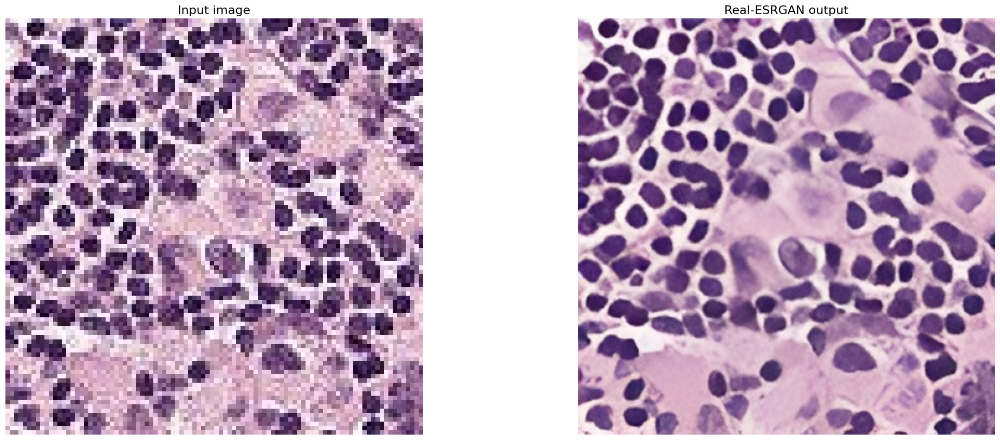

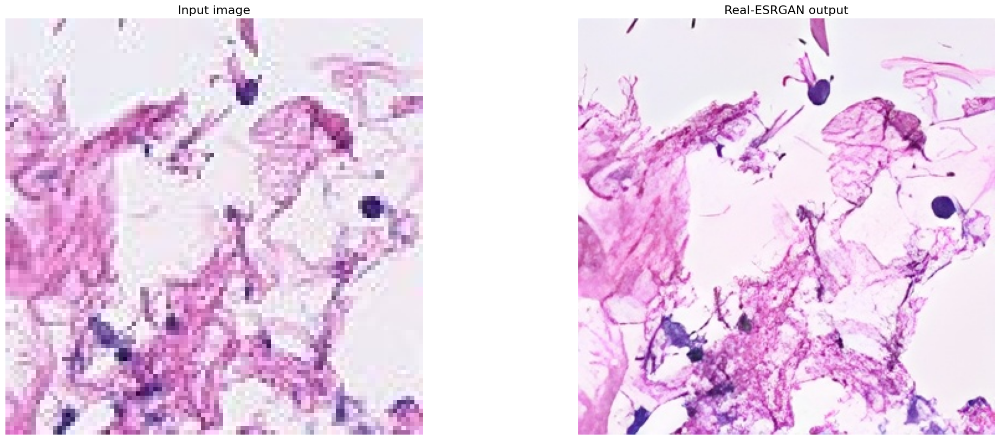

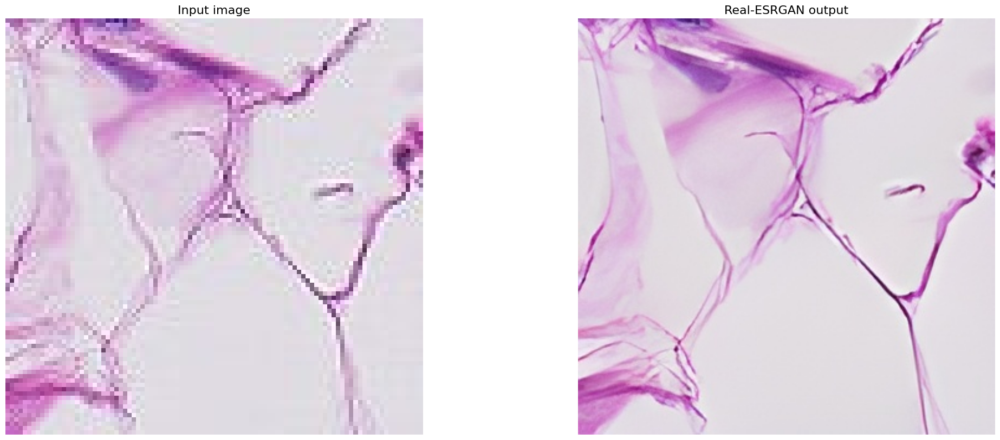

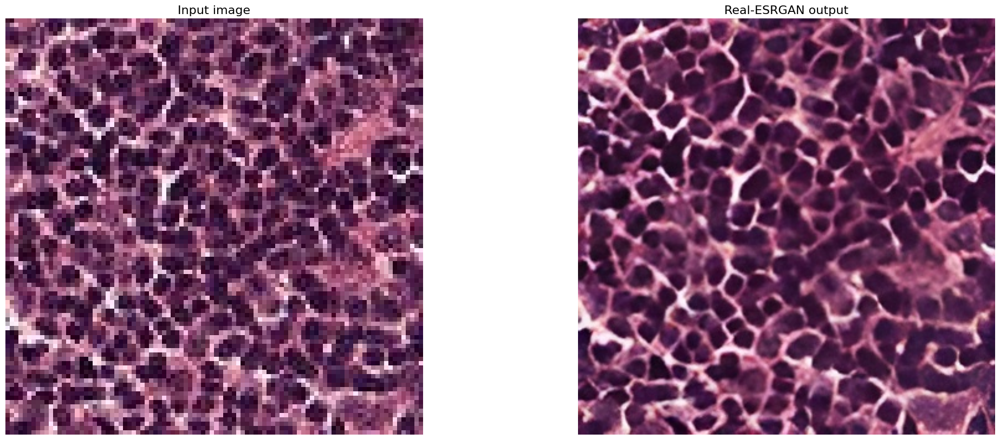

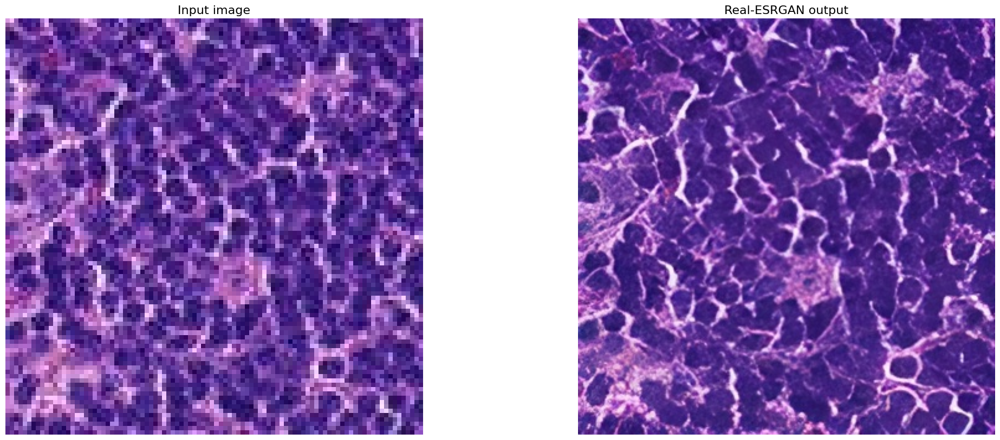

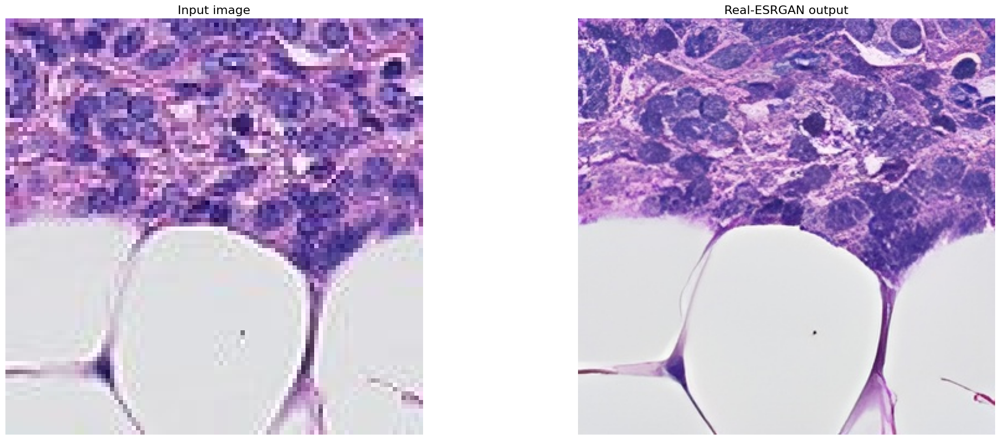

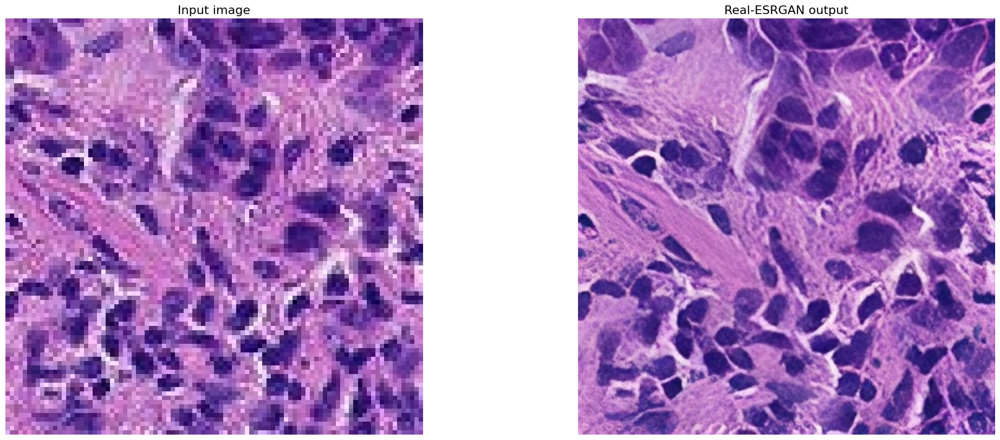

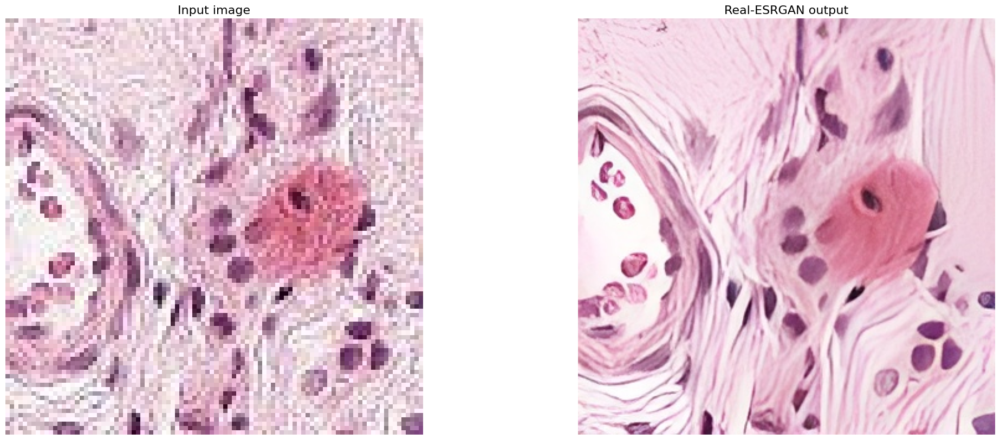

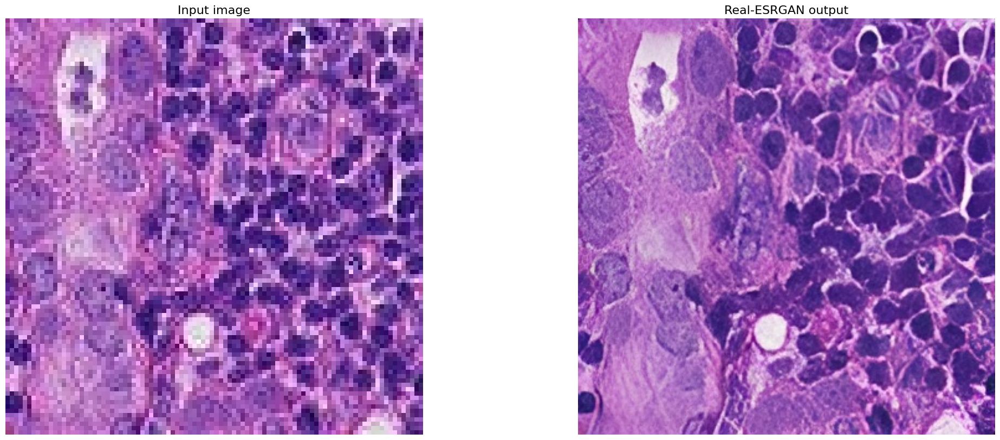

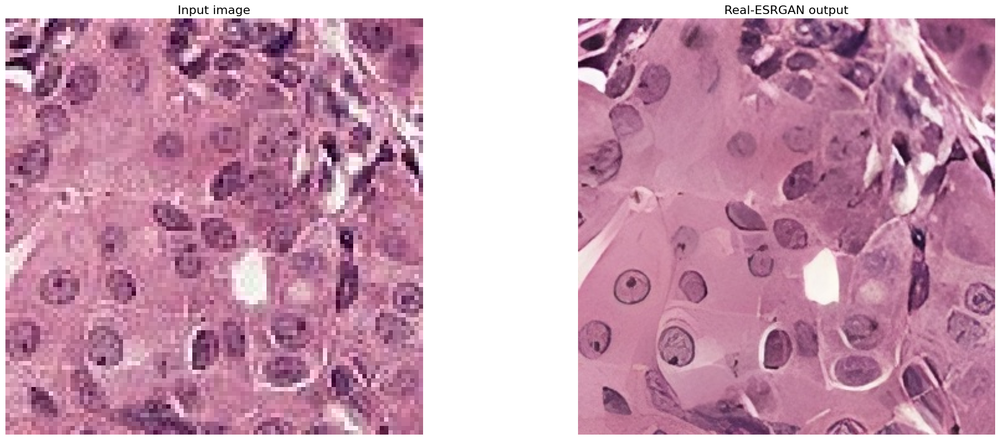

In [ ]:
# utils for visualization
import cv2
import matplotlib.pyplot as plt
def display(img1, img2):
  fig = plt.figure(figsize=(25, 10))
  ax1 = fig.add_subplot(1, 2, 1)
  plt.title('Input image', fontsize=16)
  ax1.axis('off')
  ax2 = fig.add_subplot(1, 2, 2)
  plt.title('Real-ESRGAN output', fontsize=16)
  ax2.axis('off')
  ax1.imshow(img1)
  ax2.imshow(img2)
def imread(img_path):
  img = cv2.imread(img_path)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  return img

# display each image in the upload folder
import os
import glob

input_folder = '/content/upload'
result_folder = '/content/Real-ESRGAN/results'
input_list = sorted(glob.glob(os.path.join(input_folder, '*')))
output_list = sorted(glob.glob(os.path.join(result_folder, '*')))
for input_path, output_path in zip(input_list, output_list):
  img_input = imread(input_path)
  img_output = imread(output_path)
  display(img_input, img_output)

# 5. Download Results


In [ ]:
# Download the results
from google.colab import files
zip_filename = 'Real-ESRGAN_result.zip'
if os.path.exists(zip_filename):
  os.remove(zip_filename)
os.system(f"zip -r -j {zip_filename} /content/Real-ESRGAN/scripts/*")
files.download(zip_filename)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>